In [1]:
import os
import cv2
import torch
import numpy as np
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torch.utils.data import Dataset, DataLoader
from glob import glob
from sklearn.model_selection import StratifiedShuffleSplit

# Define image transformations
train_transform = A.Compose([
    A.Resize(512, 512),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.2),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
])

test_transform = A.Compose([
    A.Resize(512, 512),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
])

# Define mapping from original values to class indices
LABEL_MAPPING = {
    0: 0,      # Class 0
    29: 1,     # Class 1
    105: 2,    # Class 2
    149: 3,    # Class 3
    178: 4,    # Class 4
    225: 5,    # Class 5
    255: 6     # Class 6
}

class DeepGlobeTrainDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform=None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]

        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        # Convert mask using mapping
        for old_val, new_val in LABEL_MAPPING.items():
            mask[mask == old_val] = new_val

        if self.transform:
            augmented = self.transform(image=img, mask=mask)
            img = augmented["image"]
            mask = augmented["mask"]

        # Convert mask to LongTensor for CrossEntropyLoss
        mask = torch.tensor(mask, dtype=torch.long)

        return img, mask

# Load paths
image_paths = sorted(glob("data/train/*.jpg"))
mask_paths = sorted(glob("data/train/*.png"))

print("Total images:", len(image_paths))
print("Total masks:", len(mask_paths))

# Compute majority class per mask
def compute_majority_class(mask_path):
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    for old_val, new_val in LABEL_MAPPING.items():
        mask[mask == old_val] = new_val
    unique, counts = np.unique(mask, return_counts=True)
    return unique[np.argmax(counts)]  # Most frequent class in the mask

# Assign a class label to each mask
mask_classes = [compute_majority_class(mask_path) for mask_path in mask_paths]

# Stratified split (90% train, 10% test)
splitter = StratifiedShuffleSplit(n_splits=1, test_size=0.1, random_state=42)
train_indices, test_indices = next(splitter.split(image_paths, mask_classes))

train_image_paths = [image_paths[i] for i in train_indices]
train_mask_paths = [mask_paths[i] for i in train_indices]
test_image_paths = [image_paths[i] for i in test_indices]
test_mask_paths = [mask_paths[i] for i in test_indices]

print(f"Training images: {len(train_image_paths)}")
print(f"Testing images: {len(test_image_paths)}")

# Create datasets
train_dataset = DeepGlobeTrainDataset(train_image_paths, train_mask_paths, transform=train_transform)
test_dataset = DeepGlobeTrainDataset(test_image_paths, test_mask_paths, transform=test_transform)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=0)
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False, num_workers=0)

C:\Users\Arsh\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
C:\Users\Arsh\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\albumentations\check_version.py:107: UserWarning: Error fetching version info <urlopen error [Errno 11001] getaddrinfo failed>
  data = fetch_version_info()


Total images: 803
Total masks: 803
Training images: 722
Testing images: 81


In [2]:
import torch
import segmentation_models_pytorch as smp

# Define the model with Swin Transformer backbone
model = smp.DeepLabV3Plus(
    encoder_name="mit_b5",  # Swin Transformer Tiny variant
    encoder_weights="imagenet",  # Pretrained on ImageNet
    classes=7,  # Number of land cover classes
    activation=None,
)

# Move to GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

DeepLabV3Plus(
  (encoder): MixVisionTransformerEncoder(
    (patch_embed1): OverlapPatchEmbed(
      (proj): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
      (norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
    )
    (patch_embed2): OverlapPatchEmbed(
      (proj): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
    )
    (patch_embed3): OverlapPatchEmbed(
      (proj): Conv2d(128, 320, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (norm): LayerNorm((320,), eps=1e-05, elementwise_affine=True)
    )
    (patch_embed4): OverlapPatchEmbed(
      (proj): Conv2d(320, 512, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2), dilation=(2, 2))
      (norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
    )
    (block1): Sequential(
      (0): Block(
        (norm1): LayerNorm((64,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          

In [3]:
print(f"Using device: {device}")

Using device: cuda


In [ ]:
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm

# Loss function
criterion = nn.CrossEntropyLoss()

# Optimizer
optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-5)

def train_model(model, train_loader, criterion, optimizer, epochs=20, device='cuda'):
    best_loss = float('inf')

    for epoch in range(epochs):
        model.train()
        train_loss = 0.0

        for images, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}"):
            images, masks = images.to(device), masks.to(device)

            optimizer.zero_grad()
            outputs = model(images)

            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()

        train_loss /= len(train_loader)
        print(f"Epoch {epoch+1}/{epochs}, Train Loss: {train_loss:.4f}")

        # Save best model
        if train_loss < best_loss:
            best_loss = train_loss
            torch.save(model.state_dict(), "best_model_2.pth")

# Example usage
train_model(model, train_loader, criterion, optimizer, epochs=20, device=device)

Epoch 1/20:   0%|          | 0/181 [00:00<?, ?it/s]C:\Users\Arsh\AppData\Local\Temp\ipykernel_4640\3954448990.py:64: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.long)
Epoch 1/20: 100%|██████████| 181/181 [33:16<00:00, 11.03s/it]


Epoch 1/20, Train Loss: 1.9190


Epoch 2/20: 100%|██████████| 181/181 [33:01<00:00, 10.95s/it]


Epoch 2/20, Train Loss: 1.3646


Epoch 3/20: 100%|██████████| 181/181 [33:05<00:00, 10.97s/it]


Epoch 3/20, Train Loss: 1.1932


Epoch 4/20: 100%|██████████| 181/181 [33:16<00:00, 11.03s/it]


Epoch 4/20, Train Loss: 1.0924


Epoch 5/20: 100%|██████████| 181/181 [33:20<00:00, 11.05s/it]


Epoch 5/20, Train Loss: 1.0162


Epoch 6/20: 100%|██████████| 181/181 [33:08<00:00, 10.99s/it]


Epoch 6/20, Train Loss: 0.9541


Epoch 7/20: 100%|██████████| 181/181 [32:35<00:00, 10.80s/it]


Epoch 7/20, Train Loss: 0.9061


Epoch 8/20: 100%|██████████| 181/181 [33:15<00:00, 11.03s/it]


Epoch 8/20, Train Loss: 0.8603


Epoch 9/20: 100%|██████████| 181/181 [33:04<00:00, 10.96s/it]


Epoch 9/20, Train Loss: 0.8165


Epoch 10/20: 100%|██████████| 181/181 [32:21<00:00, 10.73s/it]


Epoch 10/20, Train Loss: 0.7610


Epoch 11/20: 100%|██████████| 181/181 [32:50<00:00, 10.89s/it]


Epoch 11/20, Train Loss: 0.7436


Epoch 12/20: 100%|██████████| 181/181 [33:01<00:00, 10.95s/it]


Epoch 12/20, Train Loss: 0.7065


Epoch 13/20: 100%|██████████| 181/181 [33:14<00:00, 11.02s/it]


Epoch 13/20, Train Loss: 0.6865


Epoch 14/20: 100%|██████████| 181/181 [32:25<00:00, 10.75s/it]


Epoch 14/20, Train Loss: 0.6668


Epoch 15/20: 100%|██████████| 181/181 [33:20<00:00, 11.05s/it]


Epoch 15/20, Train Loss: 0.6386


Epoch 16/20: 100%|██████████| 181/181 [33:12<00:00, 11.01s/it]


Epoch 16/20, Train Loss: 0.6148


Epoch 17/20: 100%|██████████| 181/181 [33:13<00:00, 11.02s/it]


Epoch 17/20, Train Loss: 0.6194


Epoch 18/20: 100%|██████████| 181/181 [32:35<00:00, 10.81s/it]


Epoch 18/20, Train Loss: 0.5761


Epoch 19/20: 100%|██████████| 181/181 [33:50<00:00, 11.22s/it]


Epoch 19/20, Train Loss: 0.5620


Epoch 20/20: 100%|██████████| 181/181 [34:57<00:00, 11.59s/it]


Epoch 20/20, Train Loss: 0.5583


Processing Test Data:   0%|          | 0/21 [00:00<?, ?it/s]C:\Users\Arsh\AppData\Local\Temp\ipykernel_4640\3954448990.py:64: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.long)


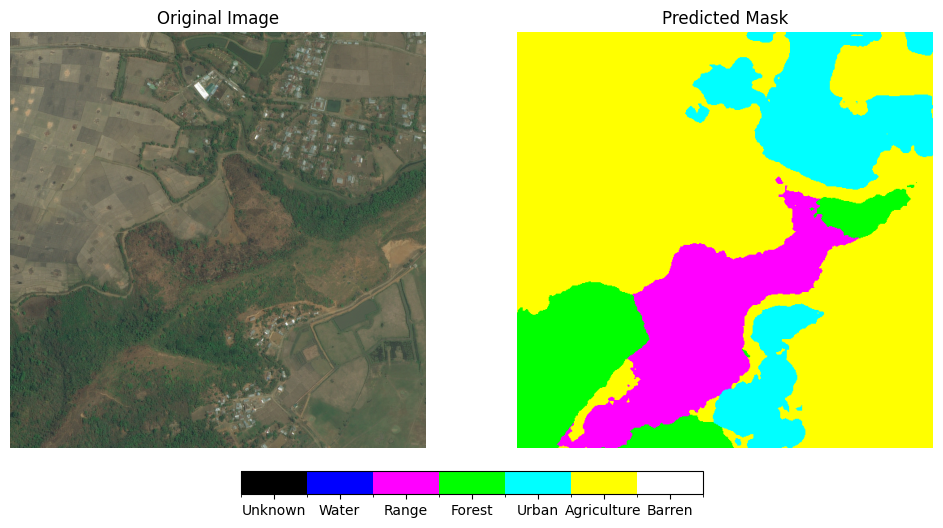

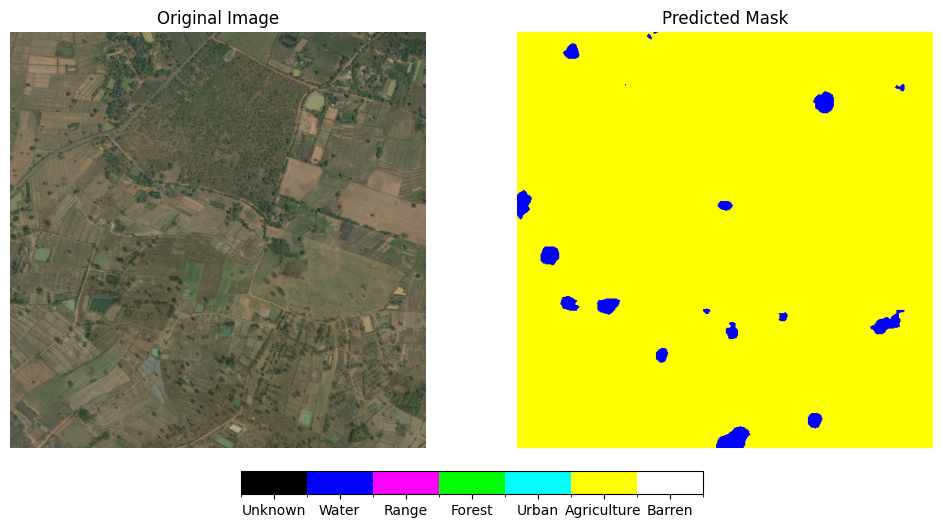

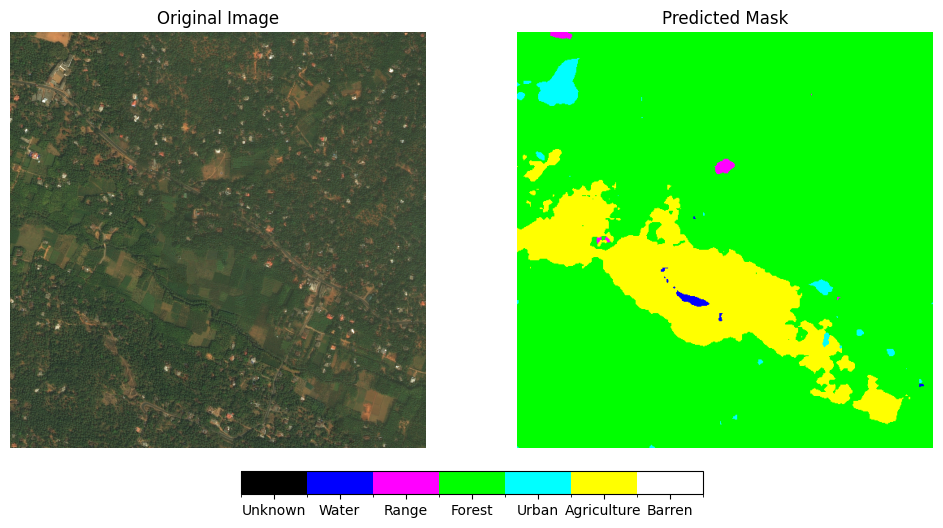

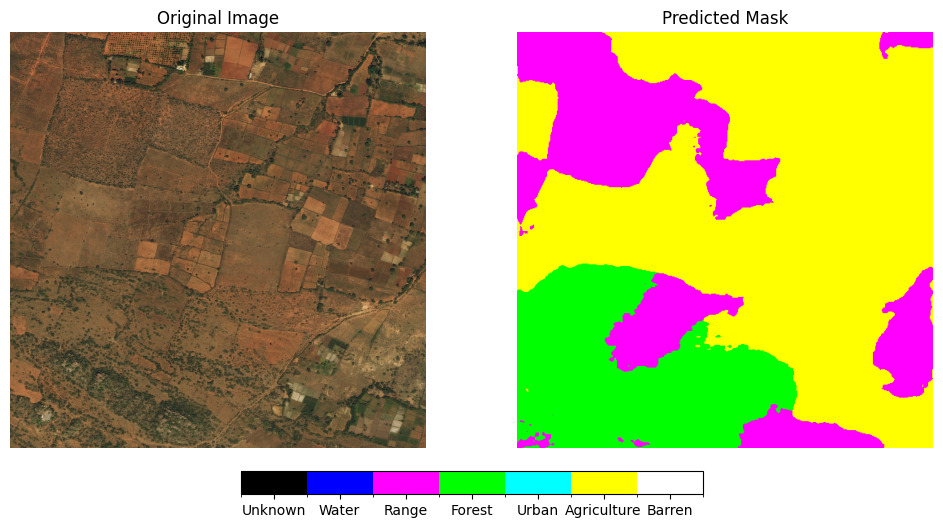

Processing Test Data:   5%|▍         | 1/21 [00:06<02:09,  6.49s/it]C:\Users\Arsh\AppData\Local\Temp\ipykernel_4640\3954448990.py:64: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.long)


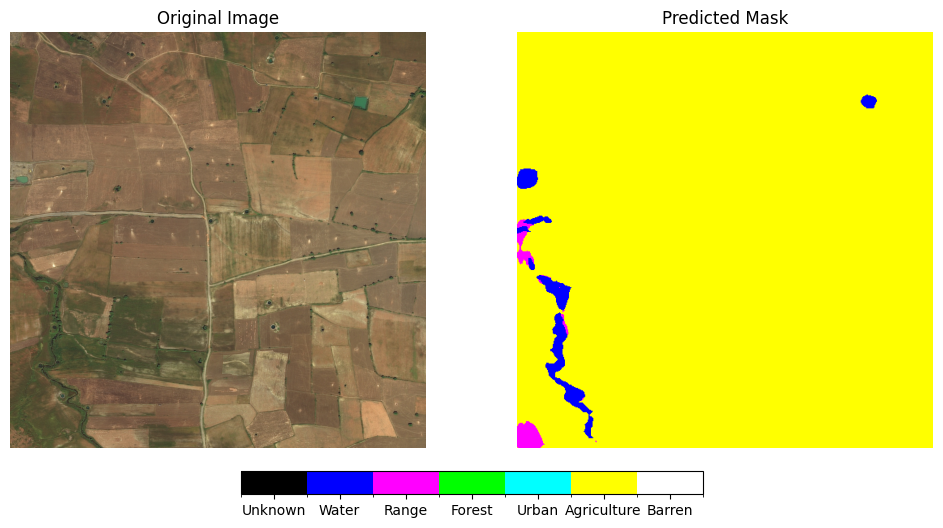

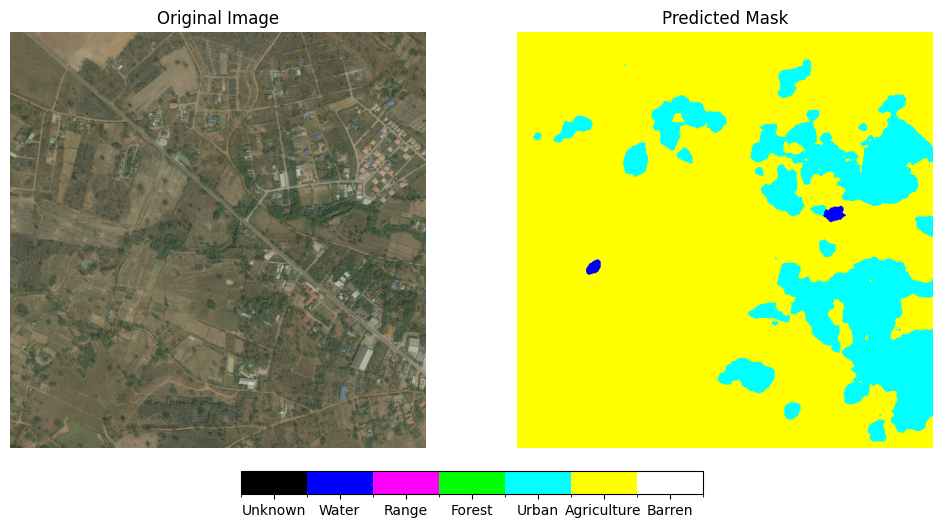

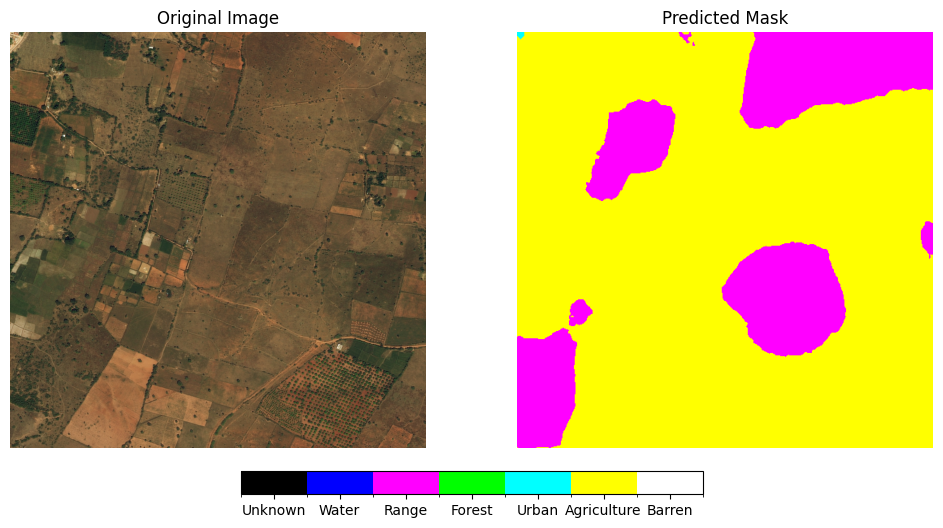

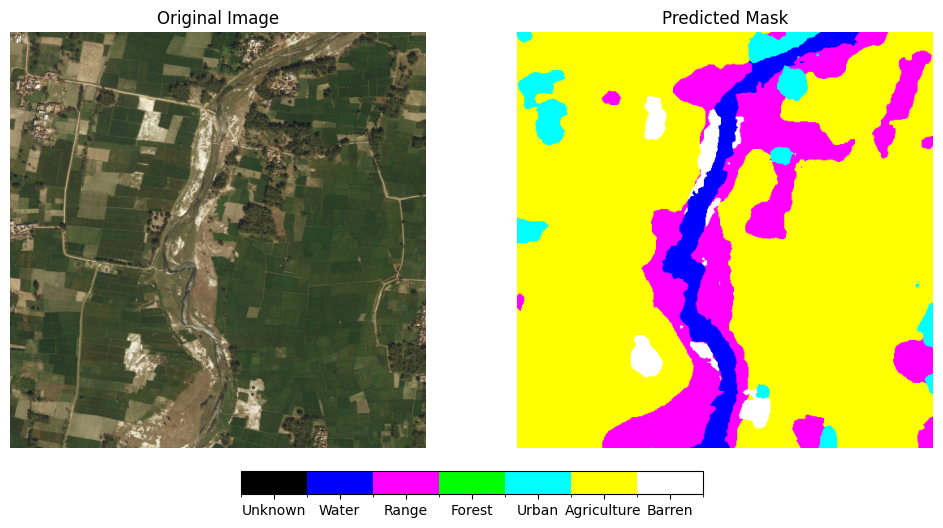

Processing Test Data:  10%|▉         | 2/21 [00:11<01:43,  5.44s/it]C:\Users\Arsh\AppData\Local\Temp\ipykernel_4640\3954448990.py:64: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.long)


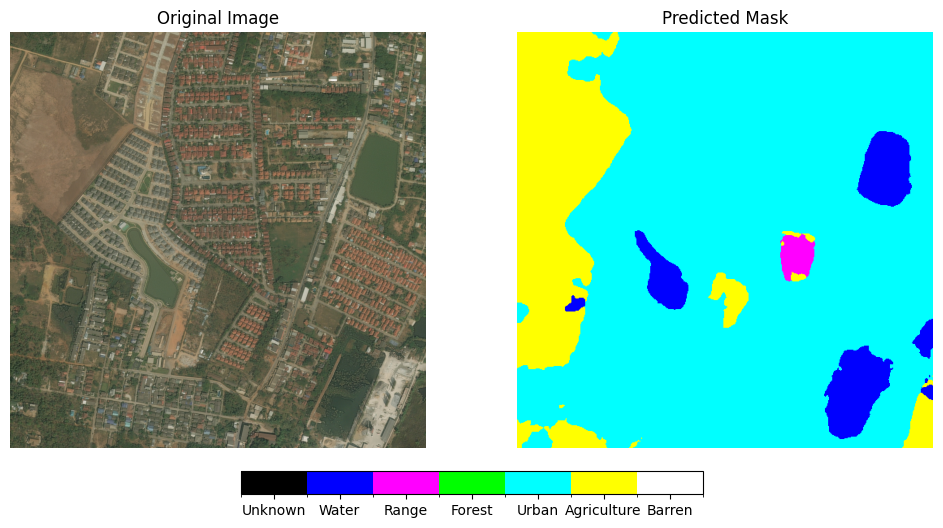

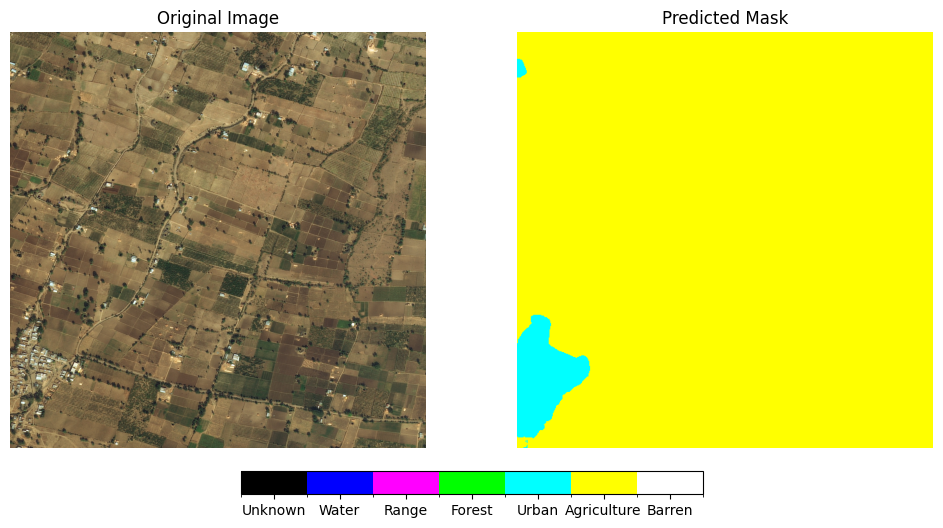

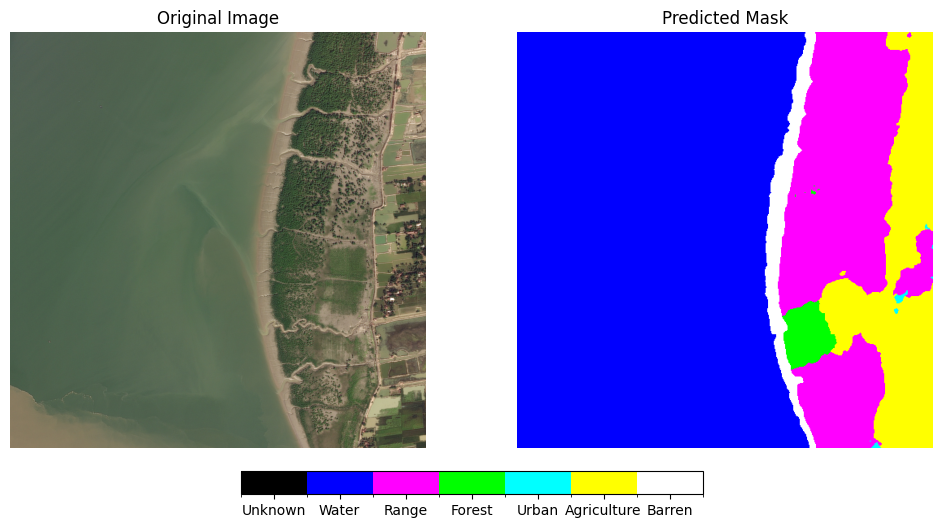

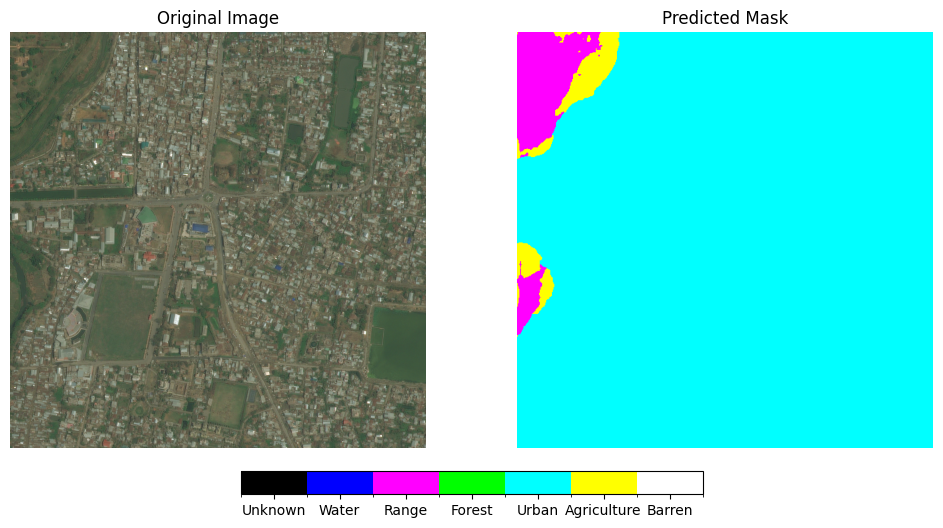

Processing Test Data:  14%|█▍        | 3/21 [00:14<01:19,  4.40s/it]C:\Users\Arsh\AppData\Local\Temp\ipykernel_4640\3954448990.py:64: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.long)


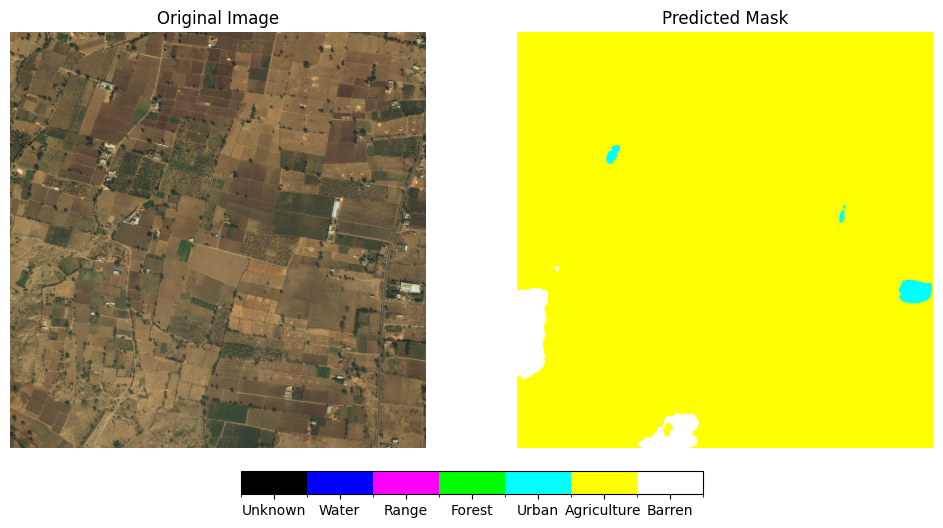

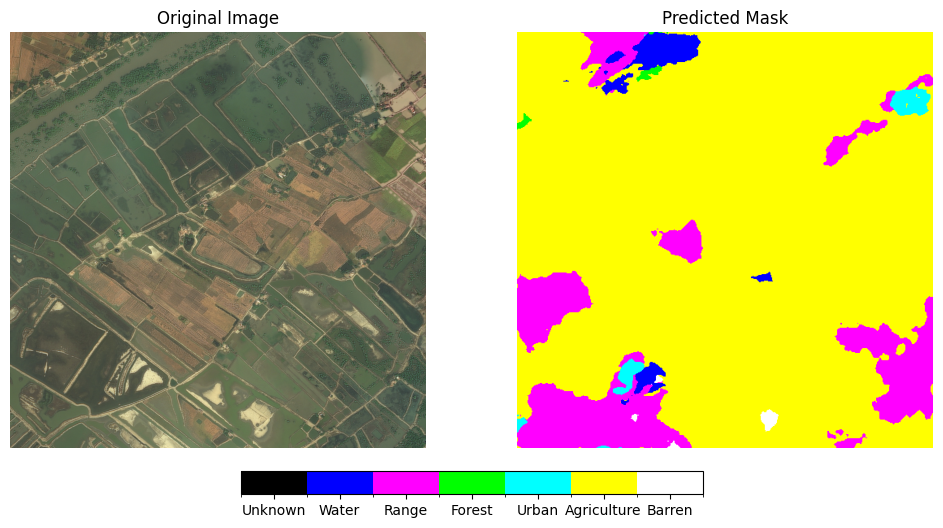

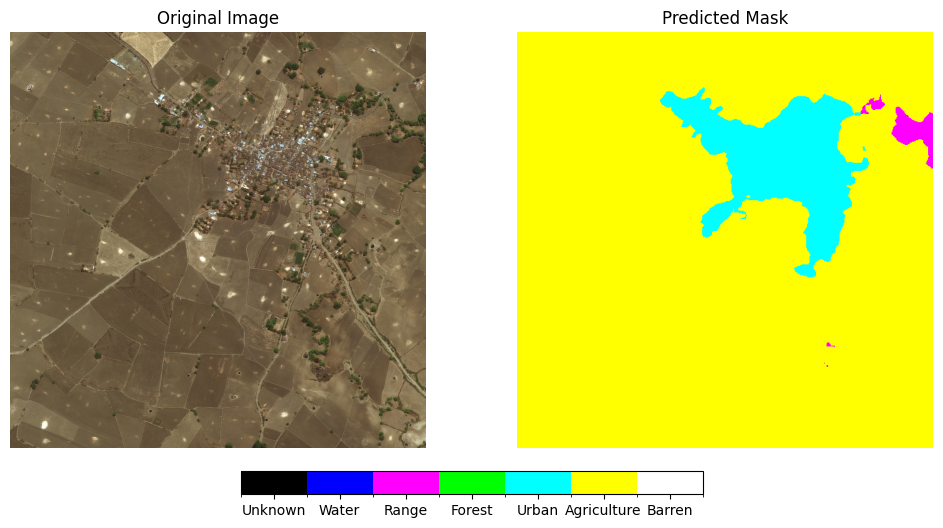

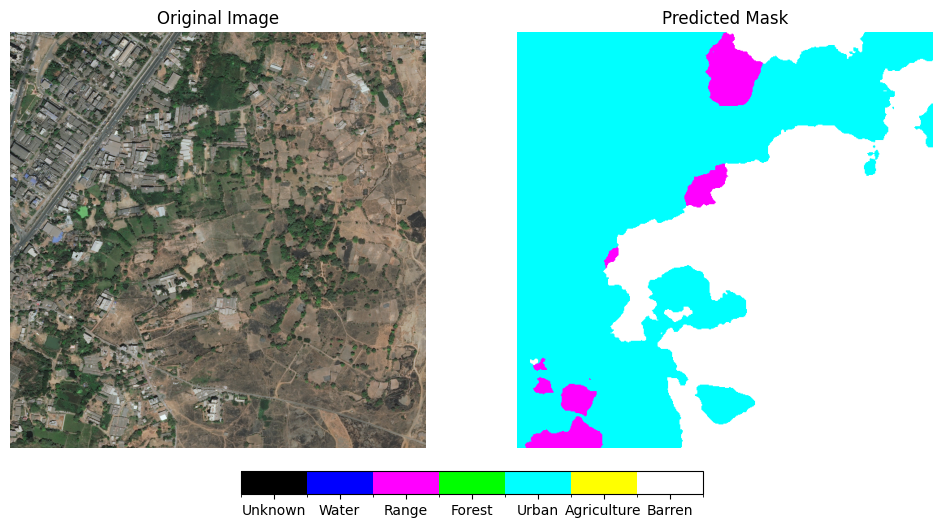

Processing Test Data:  19%|█▉        | 4/21 [00:17<01:06,  3.91s/it]C:\Users\Arsh\AppData\Local\Temp\ipykernel_4640\3954448990.py:64: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.long)


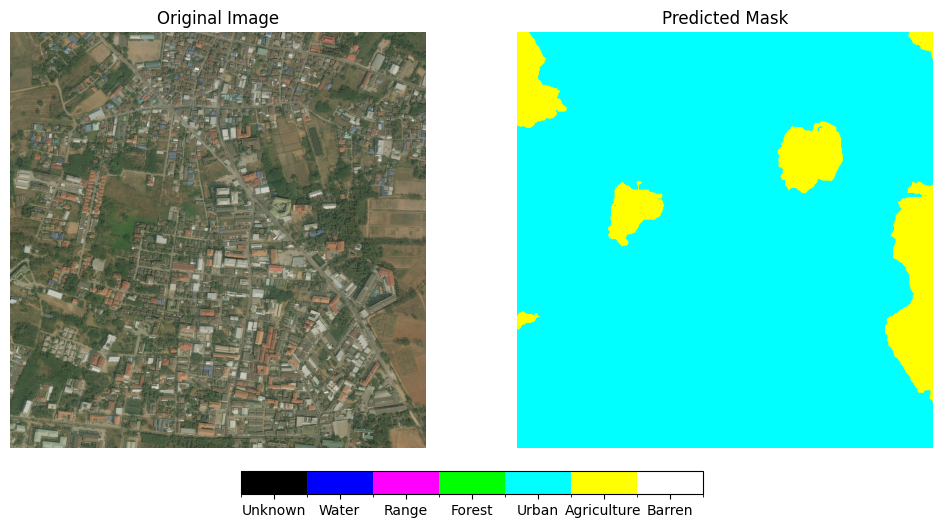

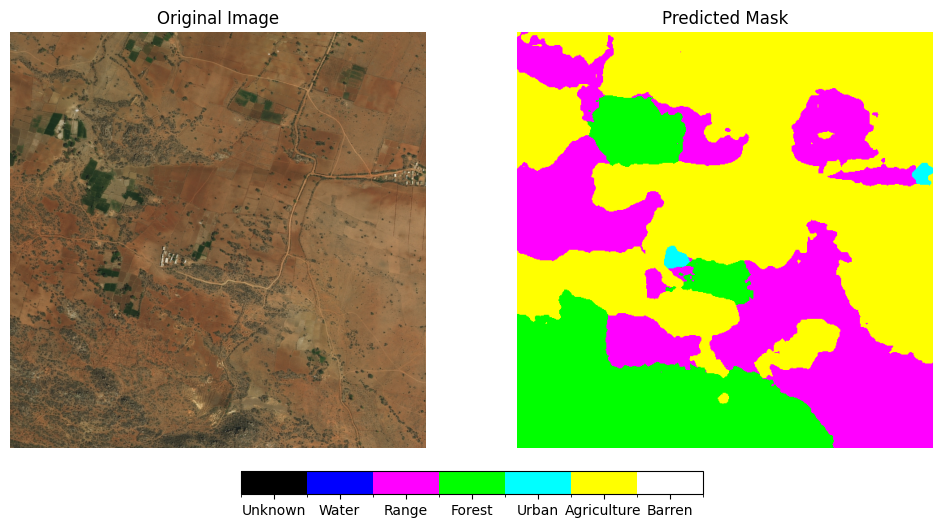

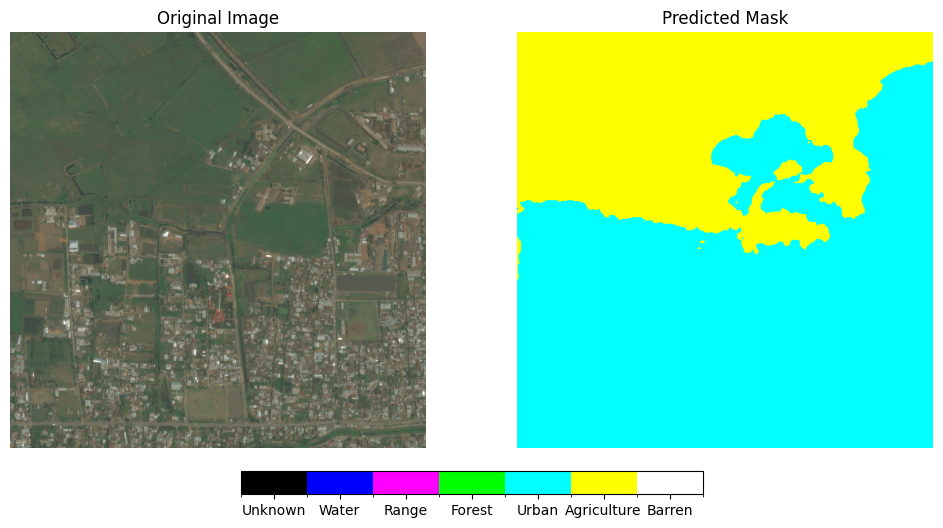

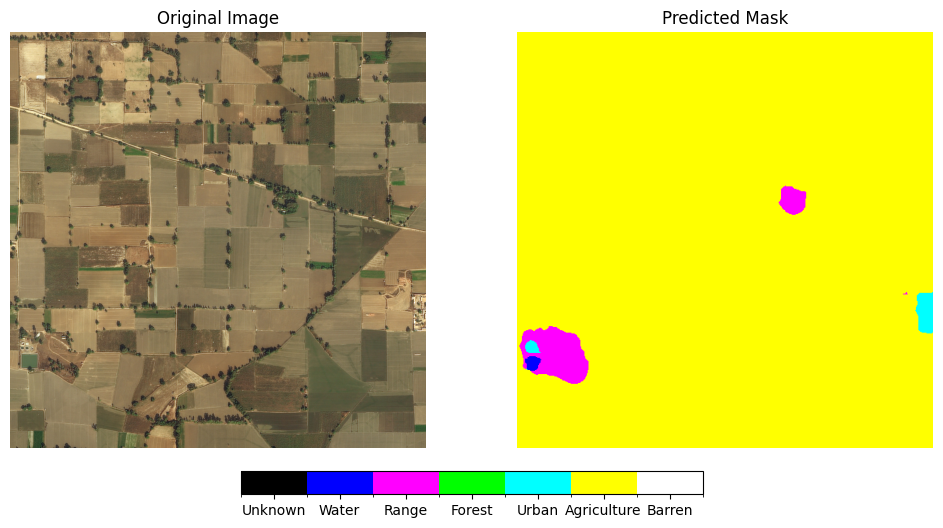

Processing Test Data:  24%|██▍       | 5/21 [00:20<00:58,  3.68s/it]C:\Users\Arsh\AppData\Local\Temp\ipykernel_4640\3954448990.py:64: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.long)
Processing Test Data:  24%|██▍       | 5/21 [00:22<01:10,  4.41s/it]


In [5]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
import torch
from tqdm import tqdm

# Define colors per class index
CLASS_COLORS = {
    0: (0, 0, 0),        # Unknown Black
    1: (0, 0, 255),      # Water Blue
    2: (255, 0, 255),    # Range Magenta
    3: (0, 255, 0),      # Forest Green
    4: (0, 255, 255),    # Urban Cyan
    5: (255, 255, 0),    # Agriculture Yellow
    6: (255, 255, 255)   # Barren White
}

CLASS_LABELS = ["Unknown", "Water", "Range", "Forest", "Urban", "Agriculture", "Barren"]

# Convert the segmentation mask to an RGB image
def convert_mask_to_rgb(mask):
    mask_rgb = np.zeros((*mask.shape, 3), dtype=np.uint8)
    for class_id, color in CLASS_COLORS.items():
        mask_rgb[mask == class_id] = color
    return mask_rgb

# Function to visualize predictions
def visualize_predictions(model, test_loader, test_image_paths, device):
    model.eval()
    count = 0

    with torch.no_grad():
        for images, masks in tqdm(test_loader, desc="Processing Test Data"):
            images = images.to(device)
            outputs = model(images)  # Get model predictions
            preds = torch.argmax(outputs, dim=1).cpu().numpy()  # Convert to numpy

            for i in range(len(images)):
                if count >= 20:
                    return
                
                mask_pred = preds[i]
                mask_rgb = convert_mask_to_rgb(mask_pred)  # Convert prediction to RGB

                # Load the corresponding original image
                image_path = test_image_paths[count]
                img = cv2.imread(image_path)
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) if img is not None else np.zeros((512, 512, 3), dtype=np.uint8)

                # Plot original image and predicted mask
                fig, ax = plt.subplots(1, 2, figsize=(12, 6))

                ax[0].imshow(img)
                ax[0].set_title("Original Image")
                ax[0].axis("off")

                ax[1].imshow(mask_rgb)
                ax[1].set_title("Predicted Mask")
                ax[1].axis("off")

                # Create a legend for class labels
                cmap = ListedColormap([np.array(CLASS_COLORS[i]) / 255 for i in CLASS_COLORS.keys()])
                norm = BoundaryNorm(boundaries=np.arange(len(CLASS_COLORS) + 1) - 0.5, ncolors=len(CLASS_COLORS))

                # Add color bar legend
                cbar = fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax.ravel().tolist(), orientation="horizontal", fraction=0.05, pad=0.05)
                cbar.set_ticks(np.arange(len(CLASS_LABELS)))
                cbar.set_ticklabels(CLASS_LABELS)

                plt.show()
                count += 1

# Ensure model is on the correct device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Call the function with test data
visualize_predictions(model, test_loader, test_image_paths, device)


In [ ]:
import torch
import torch.nn.functional as F
import numpy as np

def compute_iou(pred_mask, true_mask, num_classes):
    ious = []
    for cls in range(num_classes):
        pred_inds = pred_mask == cls
        target_inds = true_mask == cls

        intersection = (pred_inds & target_inds).sum()
        union = (pred_inds | target_inds).sum()

        if union == 0:
            ious.append(float('nan'))  # Ignore this class
        else:
            ious.append(intersection.float() / union.float())
    
    return np.nanmean(ious)  # Average over valid IoUs

# 
# Define the same model architecture before loading weights
# Define the model
model = smp.DeepLabV3Plus(
    encoder_name="mit_b5",  # Swin Transformer Tiny variant
    encoder_weights="imagenet",  # Pretrained on ImageNet
    classes=7,  # Number of land cover classes
    activation=None,
)
# Move to GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.load_state_dict(torch.load("best_model_2.pth", map_location=device))
model.to(device)
model.eval()

iou_scores = []
num_classes = 7  # Adjust based on your dataset (e.g., PASCAL VOC has 21 classes)

# Evaluate on test set
with torch.no_grad():
    for images, true_masks in test_loader:
        images, true_masks = images.to(device), true_masks.to(device)

        # Get model predictions
        outputs = model(images)
        pred_masks = torch.argmax(outputs, dim=1)  # Get class predictions

        # Compute IoU for each sample
        for pred, true in zip(pred_masks, true_masks):
            iou = compute_iou(pred.cpu(), true.cpu(), num_classes)
            iou_scores.append(iou)

# Calculate mean IoU
mean_iou = np.nanmean(iou_scores)
print(f"Mean IoU: {mean_iou:.4f}")

C:\Users\Arsh\AppData\Local\Temp\ipykernel_4640\1359065898.py:32: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("best_model_3.pth", map_loca

Mean IoU: 0.4797
